 # Project: Plant Friend
---


## Introduction

The Plant Friend project addresses a critical challenge in agriculture: the early detection of plant diseases. By leveraging advanced computer vision techniques, specifically Convolutional Neural Networks (CNNs), this project classifies plant diseases using leaf images and provides actionable remedies for farmers.

Accurate disease detection can significantly reduce crop losses, enhance food security, and mitigate economic risks for farmers. The project's objective is to develop a robust, precise, and scalable model for disease classification while continuously improving its performance.

##Preparation

We will first focus on importing the necessary packages and downloading the data.

In [1]:
# Importing packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from PIL import Image
import torchvision
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
import torch.optim as optim
import torch.nn.functional as F


We will then download and prepare the New Plant Diseases Dataset from Kaggle in the Google Colab environment. The dataset is downloaded and extracted into the directory /content/new-plant-diseases-dataset. Upon inspecting the extracted directory structure, we discovered that the dataset contains nested folders, including 'New Plant Diseases Dataset(Augmented)' and another folder of the same name within it. This nested structure underscores the importance of carefully defining paths to correctly access the train, validation, and test directories in the following steps.

In [2]:
# Installing the Kaggle API
!pip install kaggle

from google.colab import files
files.upload()  # Upload the kaggle.json file here

# Moving the Kaggle API Key to the Correct Directory
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Downloading and extracting the Dataset
!kaggle datasets download -d vipoooool/new-plant-diseases-dataset

import zipfile
import os

zip_file = "new-plant-diseases-dataset.zip"  # Adjust if the filename changes
extract_dir = "/content/new-plant-diseases-dataset"

with zipfile.ZipFile(zip_file, 'r') as zip_ref:
    zip_ref.extractall(extract_dir)

print(f"Dataset extracted to: {extract_dir}")

# Verifying the Dataset Structure
print("Contents of the dataset directory:", os.listdir(extract_dir))

Saving kaggle-2.json to kaggle-2.json
cp: cannot stat 'kaggle.json': No such file or directory
chmod: cannot access '/root/.kaggle/kaggle.json': No such file or directory
Dataset URL: https://www.kaggle.com/datasets/vipoooool/new-plant-diseases-dataset
License(s): copyright-authors
100% 2.69G/2.70G [00:09<00:00, 320MB/s]
100% 2.70G/2.70G [00:09<00:00, 292MB/s]
Dataset extracted to: /content/new-plant-diseases-dataset
Contents of the dataset directory: ['New Plant Diseases Dataset(Augmented)', 'test', 'new plant diseases dataset(augmented)']



This section of the code defines the correct paths to access the training, validation, and test datasets based on the previously discovered nested structure. The train and valid directories are located inside the second nested 'New Plant Diseases Dataset(Augmented)' folder, while the test directory is directly in the base directory.

In [3]:
import os

# Defining the paths
nested_dir = "/content/new-plant-diseases-dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)"
train_dir = os.path.join(nested_dir, "train")
valid_dir = os.path.join(nested_dir, "valid")
test_dir = "/content/new-plant-diseases-dataset/test/test"  # Test directory is in the base directory

import os

def count_images_in_dir(directory):
    total_images = 0
    class_counts = {}

    # Checking if the directory contains subdirectories
    for entry in os.listdir(directory):
        entry_path = os.path.join(directory, entry)
        if os.path.isdir(entry_path):
            num_images = len([f for f in os.listdir(entry_path) if os.path.isfile(os.path.join(entry_path, f))])
            class_counts[entry] = num_images
            total_images += num_images
        elif os.path.isfile(entry_path):
            total_images += 1

    return total_images, class_counts

# Counting images in training, validation, and test datasets
train_total, train_class_counts = count_images_in_dir(train_dir)
valid_total, valid_class_counts = count_images_in_dir(valid_dir)
test_total, test_class_counts = count_images_in_dir(test_dir)

print(f"Number of disease classes in training data: {len(train_class_counts)}")
print(f"Number of images in training data: {train_total}")
print(f"Images per class in training data: {train_class_counts}\n")

print(f"Number of disease classes in validation data: {len(valid_class_counts)}")
print(f"Number of images in validation data: {valid_total}")
print(f"Images per class in validation data: {valid_class_counts}\n")

print(f"Number of disease classes in test data: {len(test_class_counts)}")
print(f"Number of images in test data: {test_total}")
print(f"Images per class in test data: {test_class_counts}")


Number of disease classes in training data: 38
Number of images in training data: 70295
Images per class in training data: {'Blueberry___healthy': 1816, 'Tomato___Spider_mites Two-spotted_spider_mite': 1741, 'Squash___Powdery_mildew': 1736, 'Raspberry___healthy': 1781, 'Tomato___Target_Spot': 1827, 'Apple___Cedar_apple_rust': 1760, 'Potato___Late_blight': 1939, 'Apple___Apple_scab': 2016, 'Apple___Black_rot': 1987, 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)': 1722, 'Strawberry___healthy': 1824, 'Pepper,_bell___Bacterial_spot': 1913, 'Orange___Haunglongbing_(Citrus_greening)': 2010, 'Tomato___Tomato_mosaic_virus': 1790, 'Apple___healthy': 2008, 'Corn_(maize)___Northern_Leaf_Blight': 1908, 'Potato___healthy': 1824, 'Potato___Early_blight': 1939, 'Cherry_(including_sour)___healthy': 1826, 'Corn_(maize)___Common_rust_': 1907, 'Tomato___Septoria_leaf_spot': 1745, 'Tomato___healthy': 1926, 'Soybean___healthy': 2022, 'Tomato___Tomato_Yellow_Leaf_Curl_Virus': 1961, 'Grape___Black_rot': 1888, 

 There are a total of 38 distinct classes in the training dataset, including crops like grapes, corn, tomatoes, and strawberries, with categories for both healthy and diseased states. The test set does not have separate sub-directories for the images and so the number of classes is shown as 0.

The significant imbalance in dataset sizes—70,295 training samples, 17,572 validation samples, and only 33 test samples—raises concerns. A test set this small cannot reliably evaluate the model's performance or generalization ability. With so few samples, the test accuracy becomes overly sensitive to outliers and random variations, offering no statistically meaningful insight into the model's real-world applicability. To address this, the data should be merged and re-split into training, validation, and test sets with balanced proportions, ensuring the test set is large enough to provide meaningful evaluation results.

Therefore, we have merged all the data and split it into new train, validation and test directories containing 65%, 20% and 15% of the data respectively.

In [4]:
import os
import shutil
from sklearn.model_selection import train_test_split

# Defining the original directories
train_dir = "/content/new-plant-diseases-dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train"
valid_dir = "/content/new-plant-diseases-dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid"
test_dir = "/content/new-plant-diseases-dataset/test/test"

# Merging all images into a single directory
merged_dir = "/content/merged_data"
os.makedirs(merged_dir, exist_ok=True)

# Merging training and validation data
for directory in [train_dir, valid_dir]:
    for class_name in os.listdir(directory):
        class_dir = os.path.join(directory, class_name)
        target_class_dir = os.path.join(merged_dir, class_name)
        os.makedirs(target_class_dir, exist_ok=True)
        for img in os.listdir(class_dir):
            src = os.path.join(class_dir, img)
            dest = os.path.join(target_class_dir, img)
            shutil.copy(src, dest)

# Handling the test directory
test_class = "test"  # Use "test" as a placeholder class for the test images
target_class_dir = os.path.join(merged_dir, test_class)
os.makedirs(target_class_dir, exist_ok=True)
for img in os.listdir(test_dir):  # Copy all images from the flat test directory
    src = os.path.join(test_dir, img)
    dest = os.path.join(target_class_dir, img)
    shutil.copy(src, dest)

# Redistributing the data into train, val, and test splits
split_dirs = {
    "train": "/content/split_data/train",
    "val": "/content/split_data/val",
    "test": "/content/split_data/test"
}

for split in split_dirs.values():
    os.makedirs(split, exist_ok=True)

for class_name in os.listdir(merged_dir):
    class_dir = os.path.join(merged_dir, class_name)
    images = os.listdir(class_dir)

    # Checking if the directory is empty before splitting
    if not images:
        print(f"Warning: Class '{class_name}' has no images and will be skipped.")
        continue  # Skip to the next class

    # Splitting the images into train, val, and test
    train, temp = train_test_split(images, test_size=0.35, random_state=42)
    val, test = train_test_split(temp, test_size=0.4286, random_state=42)

    # Copying the images into their respective directories
    for split, split_images in zip(["train", "val", "test"], [train, val, test]):
        split_class_dir = os.path.join(split_dirs[split], class_name)
        os.makedirs(split_class_dir, exist_ok=True)
        for img in split_images:
            shutil.copy(os.path.join(class_dir, img), os.path.join(split_class_dir, img))

print("Dataset re-split completed successfully!")


Dataset re-split completed successfully!


We visualized a subset of images from the New Plant Diseases Dataset to better understand its structure and contents. For each class (e.g., healthy or diseased plant categories) in the training dataset, we displayed the first image in a grid layout, with each subplot labeled by its class name. Additionally, we printed the number of images available for each class, helping us assess the dataset's balance. To ensure clarity, we handled cases where directories might be empty by displaying a "No Images" message. Finally, we calculated and displayed the total number of images across all classes, providing a comprehensive overview of the dataset.

In [5]:
# Defining the figure size and resolution
plt.figure(figsize=(60, 60), dpi=200)

# Initializing variables
cnt = 0
plant_names = []
tot_images = 0

Diseases_classes = sorted(os.listdir(train_dir))

# Iterating through each class in the dataset
for i in Diseases_classes:
    cnt += 1
    plant_names.append(i)
    plt.subplot(7, 7, cnt)

    image_path = os.listdir(os.path.join(split_dirs["train"], i))
    print(f"\n{'-'*50}")
    print(f"The Number of Images in {i}: {len(image_path)}")
    tot_images += len(image_path)

    # Checking if the directory is empty to avoid errors
    if len(image_path) > 0:
        # Display the first image in the class
        img_show = plt.imread(os.path.join(split_dirs["train"], i, image_path[0]))
        plt.imshow(img_show)
        plt.xlabel(i, fontsize=15)
        plt.xticks([])
        plt.yticks([])
    else:
        plt.text(0.5, 0.5, 'No Images', fontsize=20, ha='center', va='center')

# Printing total number of images in the dataset
print(f"\n{'='*50}")
print(f"Total Number of Images in Directory: {tot_images}")
print(f"{'='*50}")

plt.tight_layout()
plt.show()


--------------------------------------------------
The Number of Images in Apple___Apple_scab: 1638

--------------------------------------------------
The Number of Images in Apple___Black_rot: 1614

--------------------------------------------------
The Number of Images in Apple___Cedar_apple_rust: 1430

--------------------------------------------------
The Number of Images in Apple___healthy: 1631

--------------------------------------------------
The Number of Images in Blueberry___healthy: 1475

--------------------------------------------------
The Number of Images in Cherry_(including_sour)___Powdery_mildew: 1367

--------------------------------------------------
The Number of Images in Cherry_(including_sour)___healthy: 1483

--------------------------------------------------
The Number of Images in Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot: 1333

--------------------------------------------------
The Number of Images in Corn_(maize)___Common_rust_: 1549

---------

It is important to highlight that the data is already augmentated and this is evident from the above results that show rotated images with black corners.

We create a bar plot to visualize the number of images in each plant disease class. It calculates the image count for each class, sorts them in descending order, and uses Seaborn's barplot with the "Greens" palette to display the data. The plot highlights the distribution of images across classes, making it easy to identify imbalances in the dataset.

<ipython-input-6-72120b73103e>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x= Len, y= plant_names, palette="Greens")


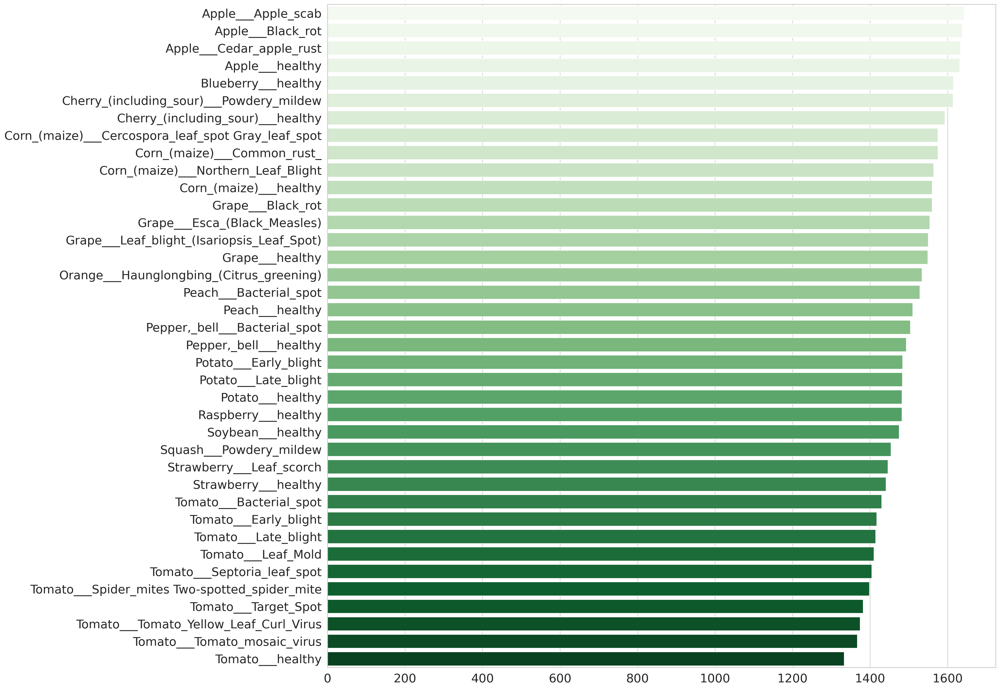

In [6]:
# Creating bar plot
plant_names = []
Len = []
for i in Diseases_classes:
    plant_names.append(i)
    imgs_path = os.listdir(split_dirs["train"] + "/" + i)
    Len.append(len(imgs_path))

Len.sort(reverse=True)

sns.set(style="whitegrid", color_codes=True)
plt.figure(figsize=(20,20),dpi=200)
ax = sns.barplot(x= Len, y= plant_names, palette="Greens")
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show()

The plot indicates that the dataset is consistently distributed across all classes, with no specific class having a dataset size small enough to potentially hinder the model's performance.

We then tranformed the images to ensure consistency in dimensions.

In [7]:
# Defining image transformations
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize images to 224x224 (standard for pretrained models)
    transforms.ToTensor(),         # Convert images to PyTorch tensors
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize using ImageNet stats
])

## Data loading

In [8]:
# Loading datasets using ImageFolder
train_dataset = ImageFolder(root=split_dirs["train"], transform=transform)
valid_dataset = ImageFolder(root=split_dirs["val"], transform=transform)
test_dataset = ImageFolder(root=split_dirs["test"], transform=transform)

# Creating DataLoaders
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True, num_workers=2)
valid_loader = DataLoader(valid_dataset, batch_size=64, shuffle=False, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=2)

# Printing dataset statistics
print(f"Number of training samples: {len(train_dataset)}")
print(f"Number of validation samples: {len(valid_dataset)}")
print(f"Number of test samples: {len(test_dataset)}")

Number of training samples: 57119
Number of validation samples: 17566
Number of test samples: 13215


The dataset statistics reveal a total of 57,119 training samples, 17,566 validation samples, and 13,215 test samples.

We then ensure all data is efficiently moved to GPU for processing during training or evaluation. The DeviceDataLoader class wraps a standard PyTorch DataLoader, automatically moving each batch of data to the device as it is iterated over. This simplifies the training loop, ensuring that data is consistently on the same device as the model, avoiding errors and enhancing performance when using a GPU.

In [9]:
# Checking and selecting device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


In [10]:
# Function to move data to the chosen device
def to_device(data, device):
    """Move tensor(s) to chosen device."""
    if isinstance(data, (list, tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

# Wrap DataLoader to move batches to the device
class DeviceDataLoader():
    """Wrap a DataLoader to move data to the device."""
    def __init__(self, dataloader, device):
        self.dataloader = dataloader
        self.device = device

    def __iter__(self):
        """Yield a batch of data after moving it to the device."""
        for batch in self.dataloader:
            yield to_device(batch, self.device)

    def __len__(self):
        """Number of batches."""
        return len(self.dataloader)

# Move data into GPU, WrappedDataLoader
train_loader = DeviceDataLoader(train_loader, device)
valid_loader = DeviceDataLoader(valid_loader, device)
test_loader = DeviceDataLoader(test_loader, device)

##Model Architechture

In [11]:
# Function to calculate accuracy
def accuracy(outputs, labels):
    _, preds = torch.max(outputs, dim=1)
    return (preds == labels).float().mean()

We then introduced an ImageClassificationBase class which provides a modular structure for managing training and validation in a PyTorch model. It defines methods for performing a single training step, computing validation loss and accuracy for batches, aggregating results across an epoch, and summarizing the metrics at the end of each epoch. By encapsulating these functionalities, it simplifies and standardizes the training workflow, making the code more reusable and easier to maintain.

In [12]:
# Base class for training and validation
class ImageClassificationBase(nn.Module):
    def training_step(self, batch):
        images, labels = batch
        outputs = self(images)  # Forward pass
        loss = F.cross_entropy(outputs, labels)  # Compute loss
        return loss

    def validation_step(self, batch):
        images, labels = batch
        outputs = self(images)  # Forward pass
        loss = F.cross_entropy(outputs, labels)  # Compute loss
        acc = accuracy(outputs, labels)  # Compute accuracy
        return {'val_loss': loss.detach(), 'val_acc': acc}

    def validation_epoch_end(self, outputs):
        batch_losses = [x['val_loss'] for x in outputs]
        epoch_loss = torch.stack(batch_losses).mean()  # Combine losses
        batch_accs = [x['val_acc'] for x in outputs]
        epoch_acc = torch.stack(batch_accs).mean()  # Combine accuracies
        return {'val_loss': epoch_loss.item(), 'val_acc': epoch_acc.item()}

    def epoch_end(self, epoch, result):
        print(f"Epoch [{epoch}], train_loss: {result['train_loss']:.4f}, val_loss: {result['val_loss']:.4f}, val_acc: {result['val_acc']:.4f}")


This code defines a CNN model with convolutional blocks, batch normalization, and residual connections. Each convolutional block extracts spatial features, normalizes them using batch normalization for stability, and applies activation for non-linearity. The residual connections allow the model to bypass certain layers, mitigating the vanishing gradient problem and enabling deeper architectures. After the convolutional layers, a classifier converts the extracted features into class predictions.

In [13]:
# Convolutional block with BatchNormalization
def ConvBlock(in_channels, out_channels, pool=False):
    layers = [
        nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
        nn.BatchNorm2d(out_channels),
        nn.ReLU(inplace=True)
    ]
    if pool:
        layers.append(nn.MaxPool2d(4))
    return nn.Sequential(*layers)

num_classes = len(train_dataset.classes)

# CNN model with residual connections
class CNN_NeuralNet(ImageClassificationBase):
    def __init__(self, in_channels, num_classes):
        super().__init__()
        self.conv1 = ConvBlock(in_channels, 64)
        self.conv2 = ConvBlock(64, 128, pool=True)
        self.res1 = nn.Sequential(ConvBlock(128, 128), ConvBlock(128, 128))
        self.conv3 = ConvBlock(128, 256, pool=True)
        self.conv4 = ConvBlock(256, 512, pool=True)
        self.res2 = nn.Sequential(ConvBlock(512, 512), ConvBlock(512, 512))
        self.classifier = nn.Sequential(
            nn.MaxPool2d(2),
            nn.Flatten(),
            nn.Linear(512, num_classes)
        )

    def forward(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.res1(x) + x
        x = self.conv3(x)
        x = self.conv4(x)
        x = self.res2(x) + x
        x = self.classifier(x)
        return x

model = to_device(CNN_NeuralNet(3, num_classes), device)
print(model)

CNN_NeuralNet(
  (conv1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (conv2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  )
  (res1): Sequential(
    (0): Sequential(
      (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inpl

The evaluate function assesses the model's performance on validation data by calculating metrics (loss, accuracy) without updating parameters or using gradients. The get_lr function retrieves the current learning rate from the optimizer, essential for tracking and debugging training when using dynamic learning rate schedules. Together, they streamline model evaluation and training diagnostics.

In [14]:
# Model Evaluation
@torch.no_grad()
def evaluate(model, valid_loader):
    model.eval()
    outputs = [model.validation_step(batch) for batch in valid_loader]
    return model.validation_epoch_end(outputs)

# Retrieve the learning rate
def get_lr(optimizer):
    for param_group in optimizer.param_groups:
        return param_group['lr']

##Training

We dynamically adjust the learning rate during each epoch for better optimization. The training loop performs forward passes, backpropagation, gradient clipping, and weight updates, while also computing validation metrics at the end of each epoch. The results, including training loss, validation loss, accuracy, and learning rates, are stored for monitoring and analysis.

In [15]:
# Fitting the model using OneCycleLR
def fit_OneCycle(epochs, max_lr, model, train_loader, valid_loader, weight_decay=0, grad_clip=None, opt_func=torch.optim.SGD):
    torch.cuda.empty_cache()
    training_history = []  # Collect training results
    optimizer = opt_func(model.parameters(), lr=max_lr, weight_decay=weight_decay)
    scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr, epochs=epochs, steps_per_epoch=len(train_loader))

    for epoch in range(epochs):
        # Training phase
        model.train()
        train_losses = []
        lrs = []
        for batch in train_loader:
            loss = model.training_step(batch)
            train_losses.append(loss)
            loss.backward()

            # Gradient clipping
            if grad_clip:
                nn.utils.clip_grad_value_(model.parameters(), grad_clip)

            optimizer.step()
            optimizer.zero_grad()

            # Updating learning rate
            lrs.append(get_lr(optimizer))
            scheduler.step()

        # Validation phase
        val_result = evaluate(model, valid_loader)
        val_result['train_loss'] = torch.stack(train_losses).mean().item()
        val_result['lrs'] = lrs
        model.epoch_end(epoch, val_result)
        training_history.append(val_result)

    return training_history

This code performs an initial evaluation of the model on the validation dataset to establish baseline performance metrics (validation loss and accuracy). It then trains the model using the fit_OneCycle function.

In [16]:
# Initializing the model
model = to_device(CNN_NeuralNet(3, num_classes), device)

# Initial evaluation (add this before starting training)
initial_eval = evaluate(model, valid_loader)
print(f"Initial evaluation: {initial_eval}")

# Training the model
num_epochs = 8
max_lr = 0.005
grad_clip = 0.15
weight_decay = 1e-4
opt_func = torch.optim.SGD

# Collecting training history
training_history = fit_OneCycle(
    num_epochs, max_lr, model, train_loader, valid_loader,
    grad_clip=grad_clip, weight_decay=weight_decay, opt_func=opt_func
)

# Appending initial evaluation to history separately for plotting
training_history.insert(0, {'val_loss': initial_eval['val_loss'], 'val_acc': initial_eval['val_acc'], 'train_loss': None})

Initial evaluation: {'val_loss': 3.6655197143554688, 'val_acc': 0.018068181350827217}
Epoch [0], train_loss: 0.7729, val_loss: 0.3355, val_acc: 0.9035
Epoch [1], train_loss: 0.2012, val_loss: 0.2183, val_acc: 0.9335
Epoch [2], train_loss: 0.0849, val_loss: 0.1030, val_acc: 0.9677
Epoch [3], train_loss: 0.0387, val_loss: 0.0527, val_acc: 0.9853
Epoch [4], train_loss: 0.0181, val_loss: 0.0472, val_acc: 0.9868
Epoch [5], train_loss: 0.0066, val_loss: 0.0302, val_acc: 0.9926
Epoch [6], train_loss: 0.0034, val_loss: 0.0284, val_acc: 0.9924
Epoch [7], train_loss: 0.0022, val_loss: 0.0282, val_acc: 0.9928


The output shows that we achieved a final validation accuracy of 99.28% after 8 epochs. The validation loss was reduced significantly to 0.0282, demonstrating robust learning.

We visualize the training and validation loss trends using a line graph, with training loss marked in orange-red and validation loss in green.

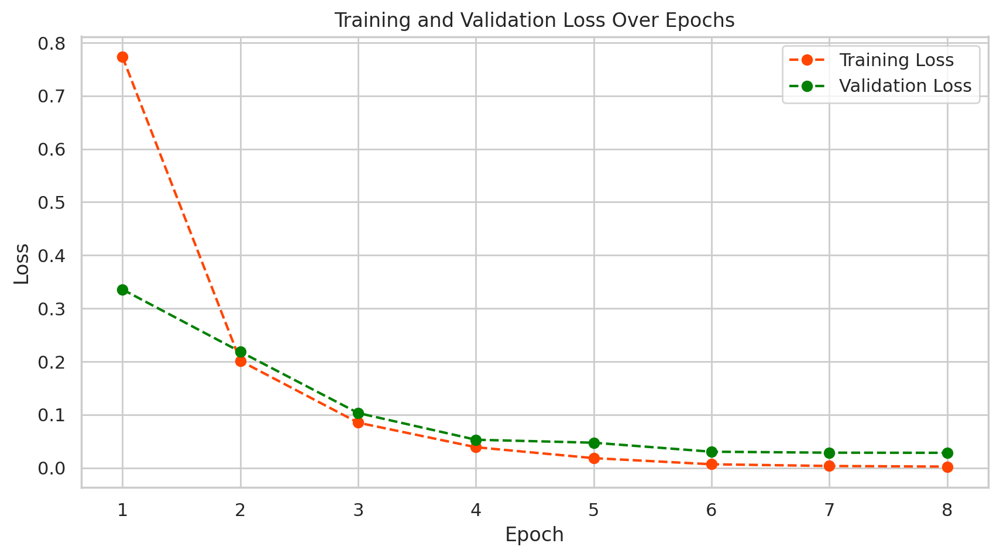

In [17]:
# Extracting values from history, excluding the initial evaluation
val_acc = [entry['val_acc'] for entry in training_history[1:]]  # Skipping the initial evaluation
val_loss = [entry['val_loss'] for entry in training_history[1:]]
train_loss = [entry['train_loss'] for entry in training_history[1:]]

epoch_count = range(1, len(training_history))

# Plotting training and validation loss
plt.figure(figsize=(10, 5), dpi=200)
plt.plot(epoch_count, train_loss, label='Training Loss', linestyle='--', color='orangered', marker='o')
plt.plot(epoch_count, val_loss, label='Validation Loss', linestyle='--', color='green', marker='o')
plt.title('Training and Validation Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.xticks(epoch_count)
plt.legend()
plt.grid(True)
plt.show()


In this plot, both the training and validation losses are aligned and decreasing. This suggests there is no noticeable sign of overfitting. We also check the accruacy trend through plotting another line graph.

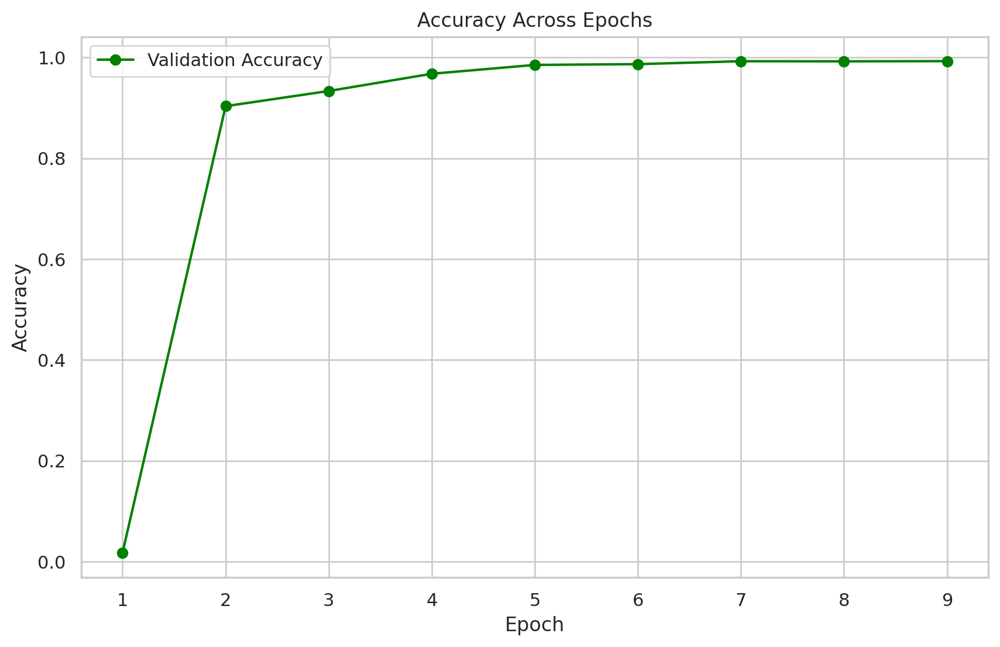

In [18]:
# Extracting accuracies
val_acc = [entry['val_acc'] for entry in training_history]
train_acc = [entry.get('train_acc') for entry in training_history if entry.get('train_acc') is not None]

epoch_count_val = range(1, len(training_history) + 1)  # For validation accuracy
epoch_count_train = range(2, len(training_history) + 1)  # Training starts after initial evaluation

# Plotting validation accuracy
plt.figure(figsize=(10, 6), dpi=200)
plt.plot(epoch_count_val, val_acc, marker='o', color='green', label='Validation Accuracy')

# Configuring the plot
plt.title('Accuracy Across Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.xticks(epoch_count_val)
plt.grid(True)
plt.legend()
plt.show()

---

##Testing entire pipeline

We now will use the test if we can generate the remedies from the images in the test dataset.

Classification Report:
                                                    precision    recall  f1-score   support

                                Apple___Apple_scab     1.0000    0.9974    0.9987       379
                                 Apple___Black_rot     1.0000    0.9973    0.9987       373
                          Apple___Cedar_apple_rust     0.9940    1.0000    0.9970       331
                                   Apple___healthy     0.9973    0.9973    0.9973       377
                               Blueberry___healthy     0.9941    0.9941    0.9941       341
          Cherry_(including_sour)___Powdery_mildew     1.0000    1.0000    1.0000       316
                 Cherry_(including_sour)___healthy     1.0000    1.0000    1.0000       343
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot     0.9742    0.9773    0.9758       309
                       Corn_(maize)___Common_rust_     0.9972    1.0000    0.9986       358
               Corn_(maize)___Northern_Leaf_Blight     0

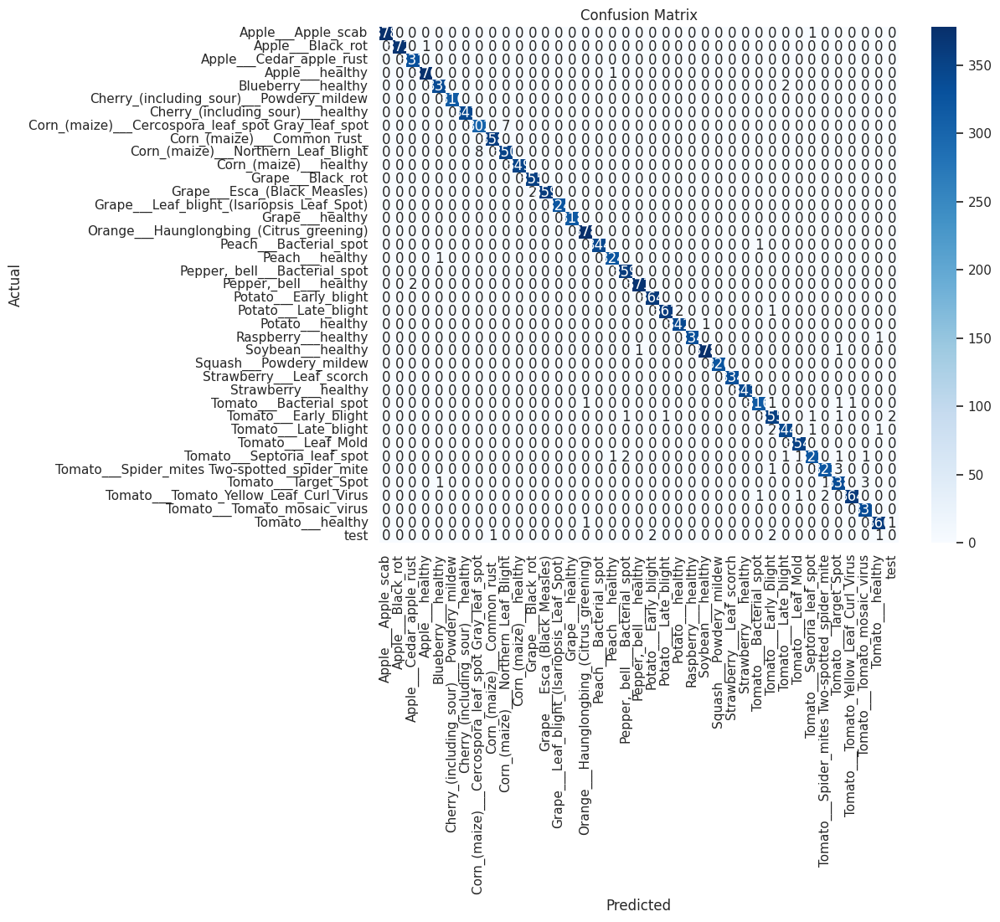

In [19]:
from sklearn.metrics import classification_report, confusion_matrix

# Evaluating model
model.eval()
true_labels = []
pred_labels = []

with torch.no_grad():
    for inputs, labels in test_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)
        true_labels.extend(labels.cpu().numpy())
        pred_labels.extend(preds.cpu().numpy())

# Classification report
classification_rep = classification_report(true_labels, pred_labels, target_names=test_dataset.classes, digits=4)
print("Classification Report:")
print(classification_rep)

# Confusion matrix
cm = confusion_matrix(true_labels, pred_labels)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='.4g', cmap='Blues', xticklabels=test_dataset.classes, yticklabels=test_dataset.classes)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()


The results show we have 99.4% test accuracy, which indicates our model is robust. Now we will focus on generating remedies for the different predicted disease.

In [20]:
from google.colab import files

# Uploading the remedies CSV which we prepared using data from US Department of Agriculture
uploaded = files.upload()

# Loading the CSV into a DataFrame
remedies_df = pd.read_csv(next(iter(uploaded)))
print("Remedies CSV file loaded successfully!")
print(remedies_df.head())

# Creating a dictionary for disease-remedy mapping
disease_to_remedy = dict(zip(remedies_df['Disease'], remedies_df['Remedy']))

Saving plant_disease_remedies.csv to plant_disease_remedies.csv
Remedies CSV file loaded successfully!
                                    Disease  \
0                     Potato___Early_blight   
1               Corn_(maize)___Common_rust_   
2                      Tomato___Target_Spot   
3  Orange___Haunglongbing_(Citrus_greening)   
4                  Apple___Cedar_apple_rust   

                                              Remedy  
0  Apply fungicides such as chlorothalonil or man...  
1  Use resistant hybrids; apply fungicides like a...  
2  Implement crop rotation; apply fungicides such...  
3  Remove and destroy infected trees; control Asi...  
4  Apply fungicides like myclobutanil; remove nea...  


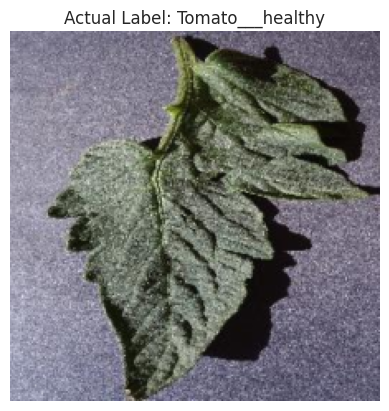

Predicted Label: Tomato___healthy
Recommended Remedy: Plant is healthy, no remedy required.


In [21]:
# Function to predict the label for a single image
def predict_image(img, model, device, class_names):
    model.eval()
    with torch.no_grad():
        img = img.unsqueeze(0).to(device)
        outputs = model(img)
        _, predicted_label = torch.max(outputs, 1)
    return class_names[predicted_label.item()]

# Specifying the index of the image you want to test
image_index = 13005
img, label = test_dataset[image_index]

# Function to denormalize the image for visualization
def denormalize(img, mean, std):
    img = img.permute(1, 2, 0)
    img = img * std + mean
    img = torch.clamp(img, 0, 1)
    return img

# Mean and std used during normalization (replace with your dataset's values)
mean = torch.tensor([0.485, 0.456, 0.406])
std = torch.tensor([0.229, 0.224, 0.225])

# Denormalizing the image
denormalized_img = denormalize(img, mean, std)

# Displaying the denormalized image
plt.imshow(denormalized_img)
plt.axis('off')
plt.title(f"Actual Label: {test_dataset.classes[label]}")
plt.show()

# Predicting and displaying the predicted label and remedy
predicted_label = predict_image(img, model, device, test_dataset.classes)
remedy = disease_to_remedy.get(predicted_label, "Remedy not found")

# Printing the predicted label and its remedy
print(f"Predicted Label: {predicted_label}")
print(f"Recommended Remedy: {remedy}")


##Final check on unseen data

We will check how good the model predicts the disease for random pictures taken from the internet.

Predicted Disease: Pepper,_bell___Bacterial_spot
Recommended Remedy: Apply copper-based bactericides; use disease-free seeds.


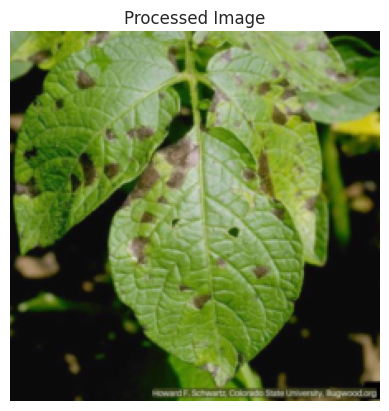

In [50]:
from PIL import Image
import torch
import matplotlib.pyplot as plt

# drag and drop the file and use '/content/<filename>'
img_path = '/content/Early-Blight-1.jpg'

# Loading the image using PIL
img = Image.open(img_path)

# Ensuring the image is in RGB format which the model is expecting
if img.mode != "RGB":
    img = img.convert("RGB")

# Preprocessing the uploaded image
img_tensor = transform(img).unsqueeze(0)
img_tensor = img_tensor.to(device)

# Running the image through the model
model.eval()
with torch.no_grad():
    outputs = model(img_tensor)
    _, predicted_idx = torch.max(outputs, dim=1)

predicted_disease = train_dataset.classes[predicted_idx.item()]
print(f"Predicted Disease: {predicted_disease}")

# Mapping the disease to its remedy
remedy = disease_to_remedy.get(predicted_disease, "Remedy not found")
print(f"Recommended Remedy: {remedy}")

# Function to show the processed image
def show_processed_image(img_tensor):
    img = img_tensor.cpu().squeeze(0).numpy().transpose(1, 2, 0)
    img = img * [0.229, 0.224, 0.225] + [0.485, 0.456, 0.406]
    img = img.clip(0, 1)

    plt.imshow(img)
    plt.axis('off')
    plt.title("Processed Image")
    plt.show()

show_processed_image(img_tensor)


##Limitations
The model performs well for diseases like **Strawberry Leaf Scorch** due to clear patterns and sufficient training data. However, it struggles with similar diseases, such as predicting **Tomato Bacterial Spot** instead of **Tomato Mosaic Virus**, likely due to overlapping visual symptoms. A key limitation is its inability to identify diseases outside the training classes, leading to misclassification of unseen conditions. Additionally, variations in image quality, lighting, and angles further impact accuracy, making the model less robust in real-world scenarios. To improve, the training should be done on more diverse and representative data to better cope with real-world challenges.

## Conclusions and Future Work

**Conclusions**:
- The Plant Friend project successfully demonstrated the use of CNNs for plant disease detection, achieving high accuracy on a diverse dataset.
- This model has the potential to aid farmers in identifying diseases early and taking corrective actions.

**Future Work**:
1. Incorporate transfer learning with pre-trained models like ResNet to improve accuracy and training efficiency.
2. Expand the dataset to include more diverse and underrepresented diseases.
3. Implement Grad-CAM for better model interpretability and debugging.

With these enhancements, the Plant Friend project could be further optimized to make a real-world impact.
